In [1]:
import pandas as pd
import plotly.express as px

In [4]:
train = pd.read_csv('/home/workspace/data/GLDv2/train/train_custom.csv')

In [5]:
# displaying only top 30 landmark
landmark = train.landmark_id.value_counts()
landmark_df = pd.DataFrame({'landmark_id':landmark.index, 'frequency':landmark.values}).head(30)

landmark_df['landmark_id'] = landmark_df.landmark_id.apply(lambda x: f'landmark_id_{x}')

fig = px.bar(landmark_df, x="frequency", y="landmark_id",color='landmark_id', orientation='h',
             hover_data=["landmark_id", "frequency"],
             height=1000,
             title='Number of images per landmark_id (Top 30 landmark_ids)')
fig.show()

- landmark 종류는 102,203개, 이미지 전체 개수는 2,549,597개
- 10,000개 이미지를 가진 랜드마크가 존재함(landmark id: 138982)
- 그 다음엔 4000개 이미지를 가진 랜드마크가 존재함(landmark id: 62798)
- 1개 이미지를 가진 랜드마크도 존재함
- 97,654개의 랜드마크가 100개 이하 이미지를 가지고 있음(95.5%)

In [22]:
landmark_df = landmark.to_frame(name='frequency')

In [25]:
landmark_df[landmark_df['frequency'] <= 100]

,frequency
landmark_id,
165103,100
188772,100
168227,100
5844,100
88408,100
...,...
131144,1
131156,1
99745,1


In [30]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2549598 entries, 0 to 2549597
Data columns (total 5 columns):
 #   Column         Dtype 
---  ------         ----- 
 0   id             object
 1   landmark_id    int64 
 2   supercategory  object
 3   description    object
 4   language       object
dtypes: int64(1), object(4)
memory usage: 97.3+ MB


In [31]:
import PIL
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
TRAIN_DIR = '/home/workspace/data/GLDv2/train/image'

def display_images(images, title=None): 
    f, ax = plt.subplots(5,5, figsize=(18,22))
    if title:
        f.suptitle(title, fontsize = 30)

    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id[0]}/{image_id[1]}/{image_id[2]}/{image_id}.jpg')
        image = Image.open(image_path)
        
        ax[i//5, i%5].imshow(image) 
        image.close()       
        ax[i//5, i%5].axis('off')

        landmark_id = train[train.id==image_id.split('.')[0]].landmark_id.values[0]
        ax[i//5, i%5].set_title(f"ID: {image_id.split('.')[0]}\nLandmark_id: {landmark_id}", fontsize="12")

    plt.show() 

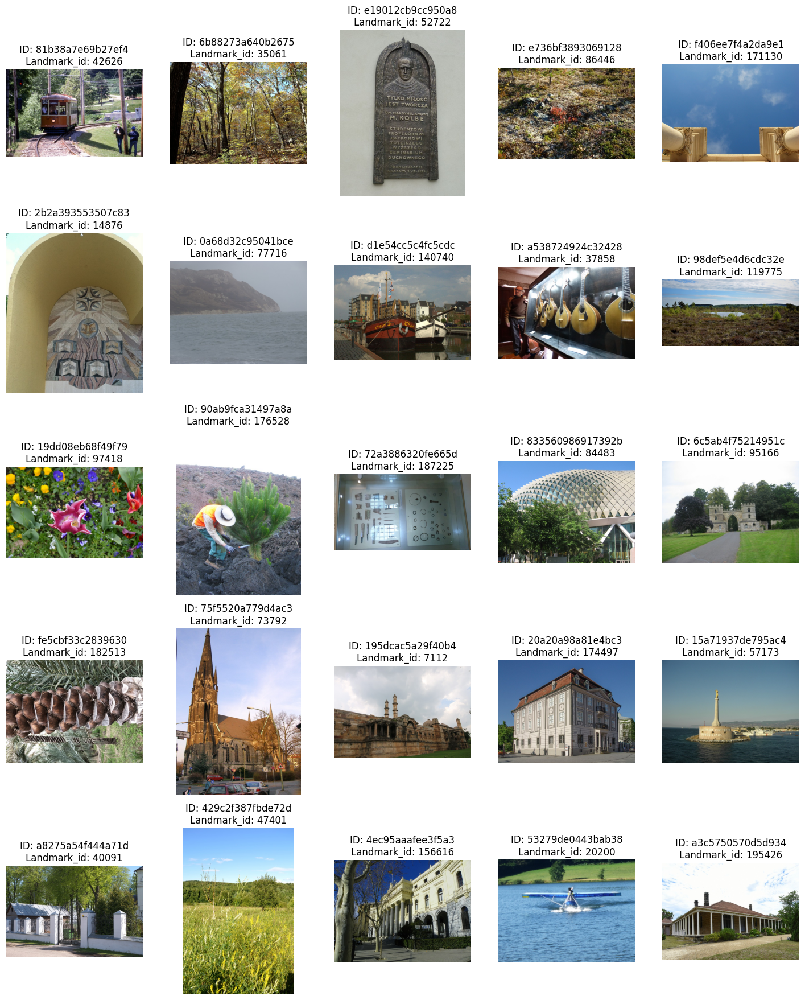

In [32]:
samples = train.sample(25).id.values
display_images(samples)

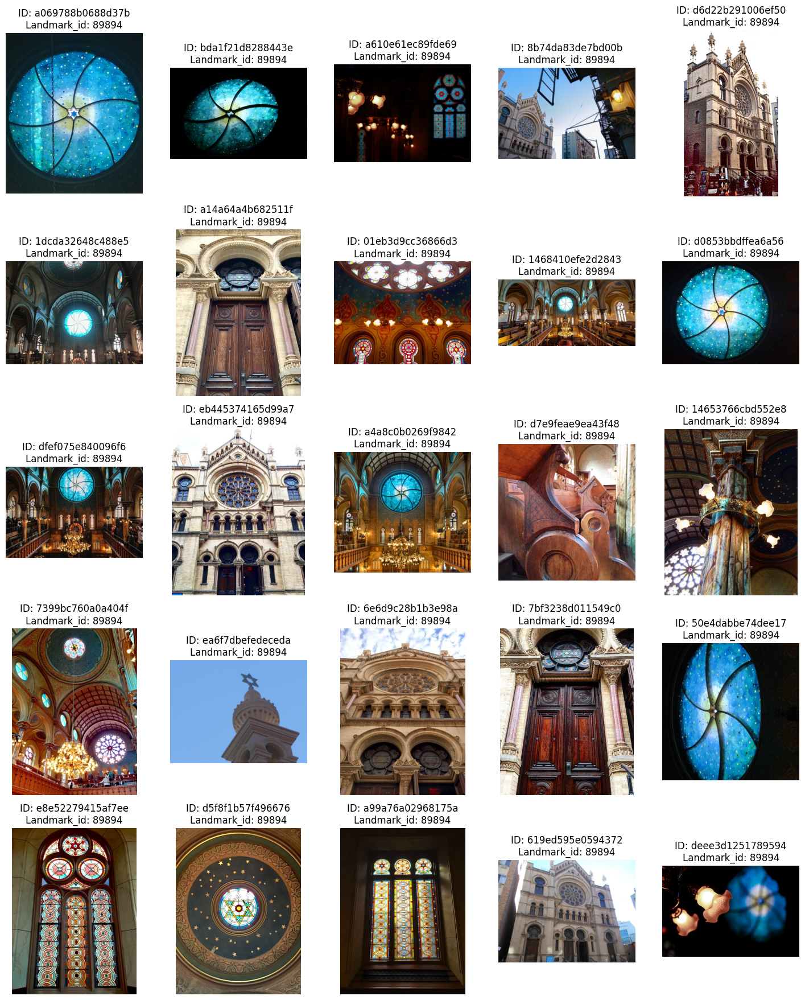

In [33]:
samples = train[train.landmark_id == 89894].sample(25).id.values

display_images(samples)

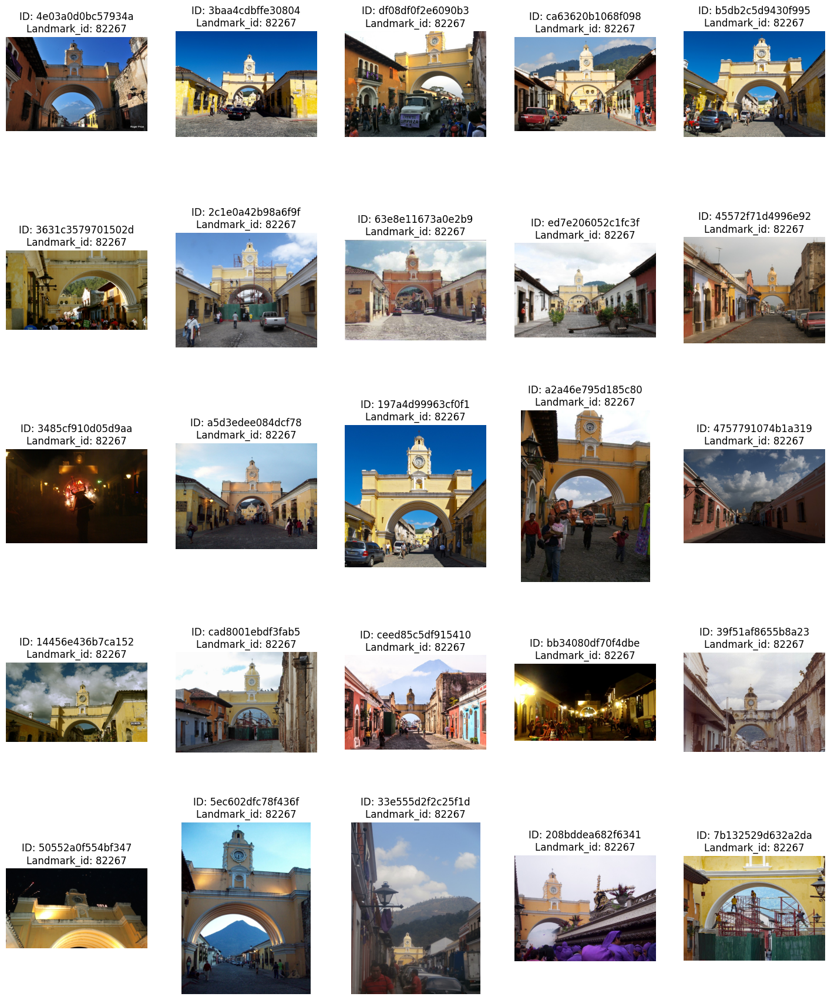

In [36]:
samples = train[train.landmark_id == 82267].sample(25).id.values

display_images(samples)

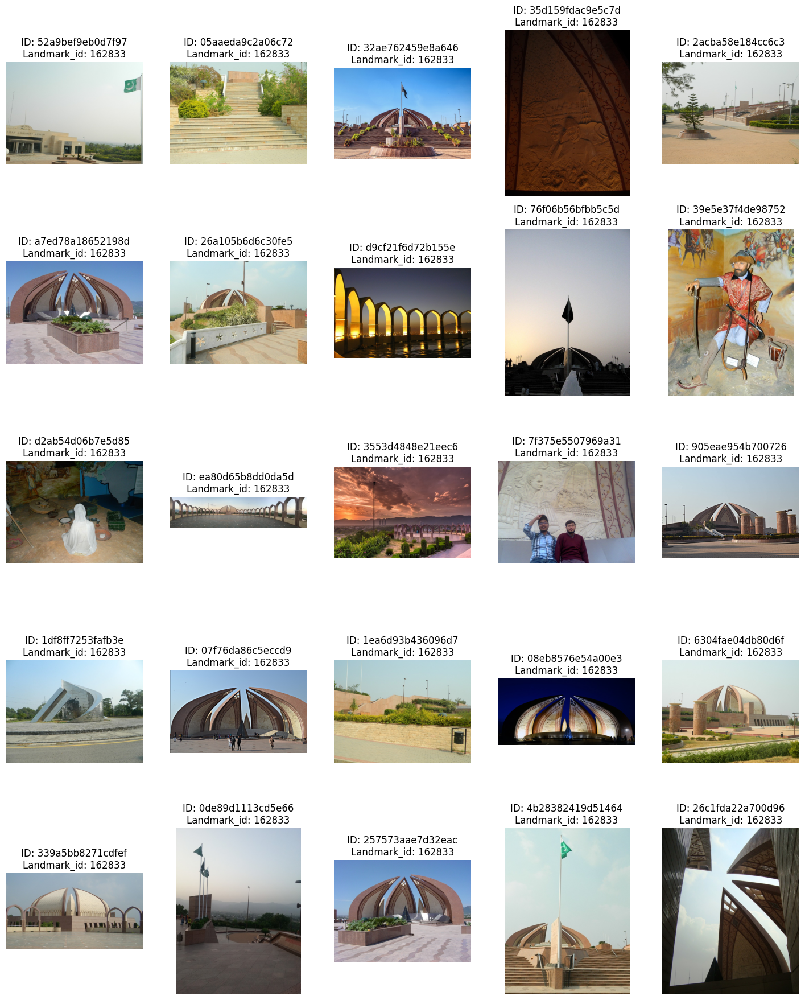

In [37]:
samples = train[train.landmark_id == 162833].sample(25).id.values

display_images(samples)

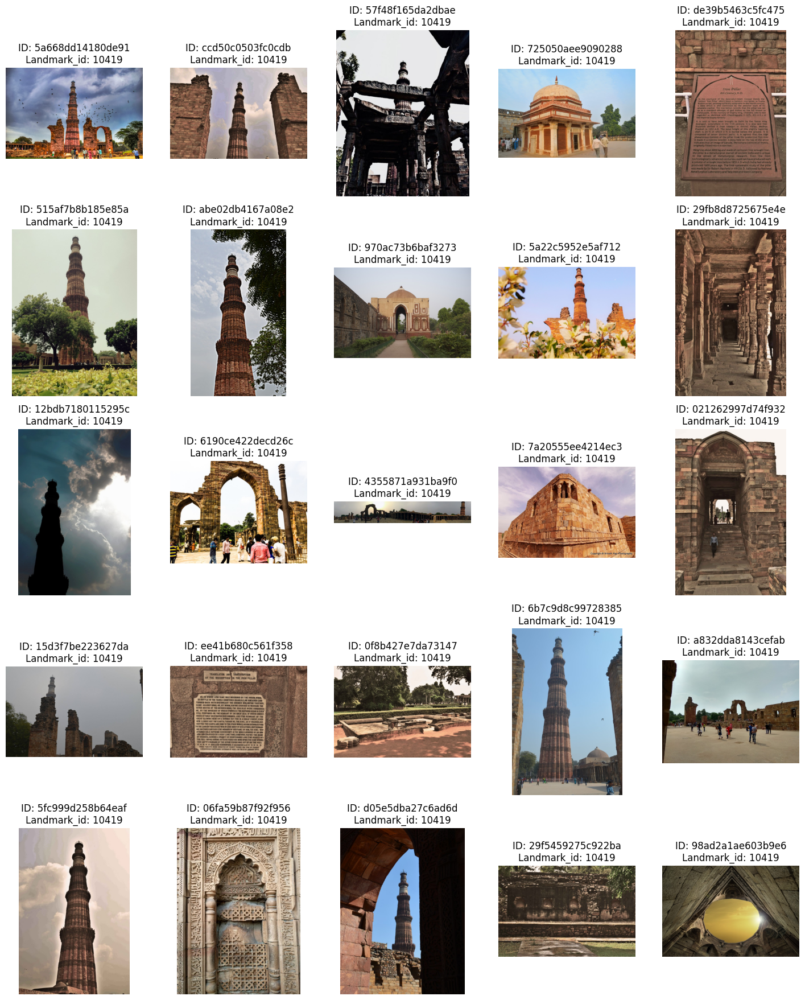

In [38]:
samples = train[train.landmark_id == 10419].sample(25).id.values

display_images(samples)

### 랜드마크별 균등 샘플링

In [45]:
# 각 랜드마크당 최대 K개의 이미지를 샘플링
# 만약 K개보다 적으면, 있는 만큼 모두 샘플링
K = 1

# groupby와 apply를 사용하여 각 그룹(랜드마크)별로 샘플링 수행
sample_df = train.groupby('landmark_id').apply(
    lambda x: x.sample(n=min(len(x), K)),
    include_groups=False # pandas > 2.x
).reset_index(drop=True)

In [46]:
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102203 entries, 0 to 102202
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             102203 non-null  object
 1   supercategory  102203 non-null  object
 2   description    102203 non-null  object
 3   language       102203 non-null  object
dtypes: object(4)
memory usage: 3.1+ MB


In [47]:
sample_df.to_csv('/home/workspace/data/GLDv2/train/train_custom_sampling.csv')